In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import glob
import pickle

from IPython.display import display 
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [2]:
img_name = []
for i in range(90, 130, 10):
#     img_name = glob.glob('../sample_image/pracimg_name/resize/'+str(i)+'/*.png')
    tmp = glob.glob('../sample_image/pracimages/resize4/'+str(i)+'/*.png')
    img_name.append(tmp)

In [3]:
img_name = img_name[0] + img_name[1] + img_name[2] + img_name[3]

In [4]:
pid = []
weight = []
images = []
for i, img in zip(range(len(img_name)), img_name):
    if img_name[i][37] == '/':
        pid.append(img_name[i][38:46])
        weight.append(img_name[i][47:52])
    else:
        pid.append(img_name[i][39:47])
        weight.append(img_name[i][48:53])
    
#     img = cv2.imread(img)
    img = cv2.imread(img)
    img = img[50:250, 0:500]
    images.append(img)
    
weight = np.array(weight).astype(int)
weight = weight/100

In [5]:
df = pd.DataFrame(data={'pid': pid, 'weight': weight, 'images':images})
df.sort_values('pid', inplace=True)
df.reset_index(inplace=True, drop=True)
df.tail()

,images,pid,weight
555,"[[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...",p28img16,121.22
556,"[[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...",p28img17,124.70
557,"[[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...",p28img18,120.82
558,"[[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...",p28img19,121.72
559,"[[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...",p28img20,124.12


In [7]:
del pid, weight, img, images

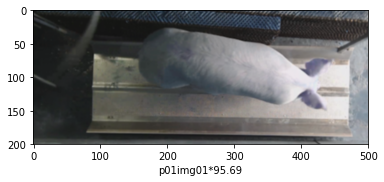

In [6]:
for i in range(len(df.images)):
    plt.imshow(df.images[i], interpolation='bicubic')
    plt.xlabel(df.pid[i]+ '*' +str(df.weight[i]))
    plt.show()
    break

In [7]:
df.images.tail()

555    [[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...
556    [[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...
557    [[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...
558    [[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...
559    [[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...
Name: images, dtype: object

In [8]:
len(df)

560

In [9]:
from keras.preprocessing.image import ImageDataGenerator

/Users/choihojeong/.pyenv/versions/anaconda3-5.0.1/envs/conda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [17]:
train_generator = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=1,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=True,)

In [11]:
df.images.tail()

555    [[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...
556    [[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...
557    [[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...
558    [[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...
559    [[[81, 91, 90], [81, 91, 90], [81, 91, 90], [8...
Name: images, dtype: object

In [24]:
df.images.iloc[-1].shape, df.images.shape

((200, 500, 3), (560,))

In [33]:
X = df.images.as_matrix()

In [35]:
type(X), X.shape

(numpy.ndarray, (560,))

In [38]:
X_new = X[:,:,:,np.newaxis]

IndexError: too many indices for array

In [22]:
X_new.shape

(200, 500, 3, 1)

In [60]:
train_generator.fit(X_new)

In [62]:
# for i in range(len(X_new)):
#     plt.imshow(X_new[i, :, :, 0], cmap='gray', interpolation='bicubic')
#     plt.show()
#     plt.xticks([])
#     plt.yticks([])

In [63]:
batch_size = 7
iterator = train_generator.flow(X_new[:batch_size])

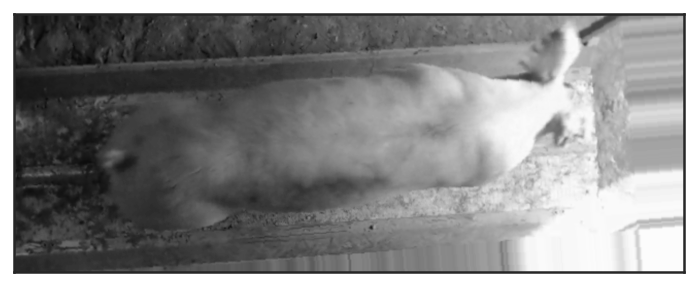

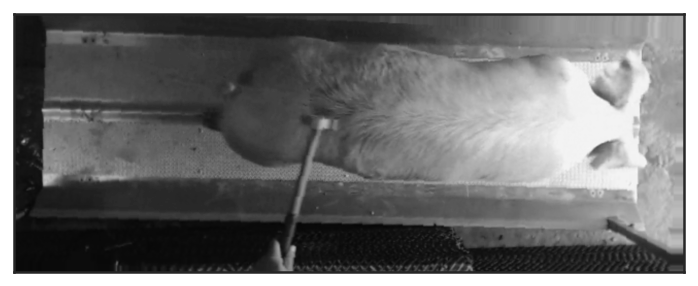

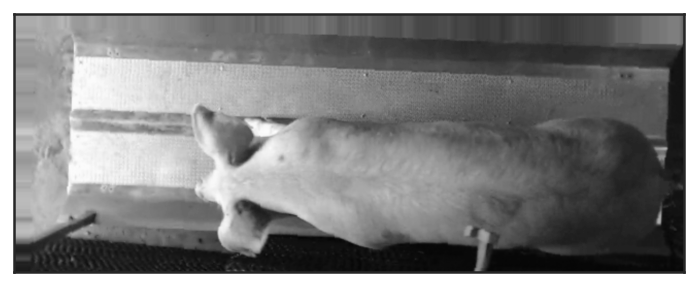

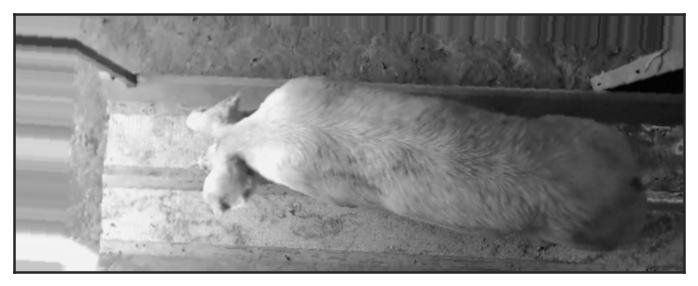

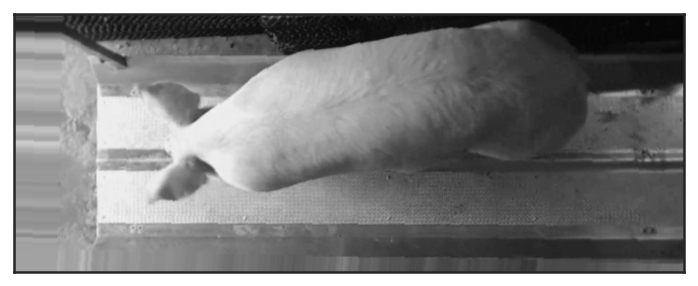

...

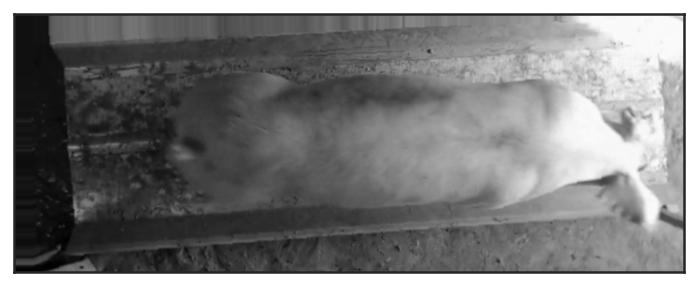

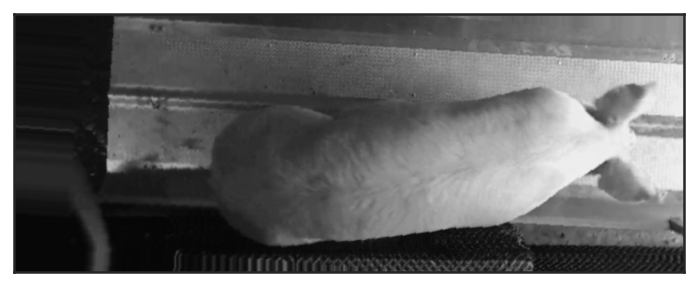

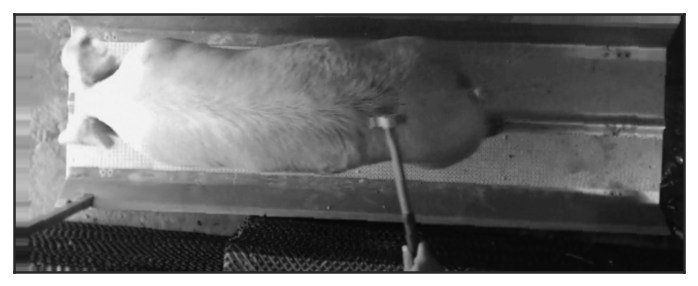

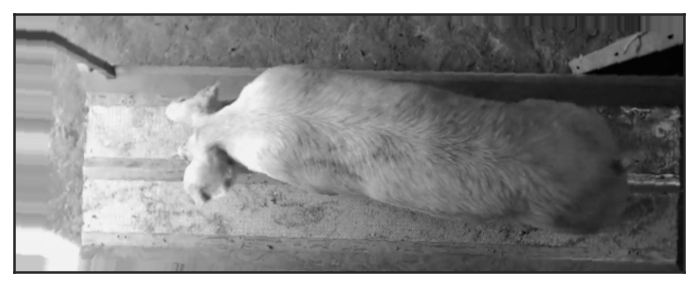

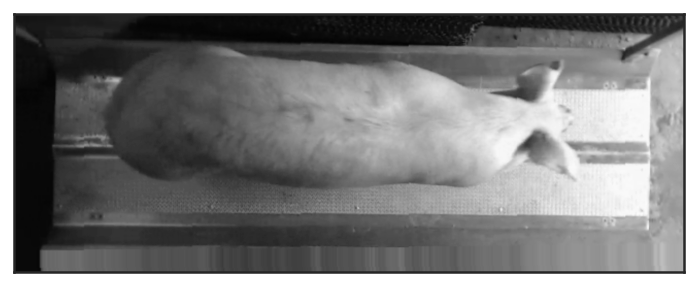

In [64]:
for i in range(int(35 / batch_size)):
    x_augs = iterator.next()
    for j in range(batch_size):
#         plt.subplot(5, 7, batch_size * i + j + 1)
        plt.imshow(x_augs[j, :, :, 0], cmap='gray', interpolation='bicubic')
        plt.xticks([])
        plt.yticks([])
        plt.show()
plt.tight_layout()

# load data image, gray scale

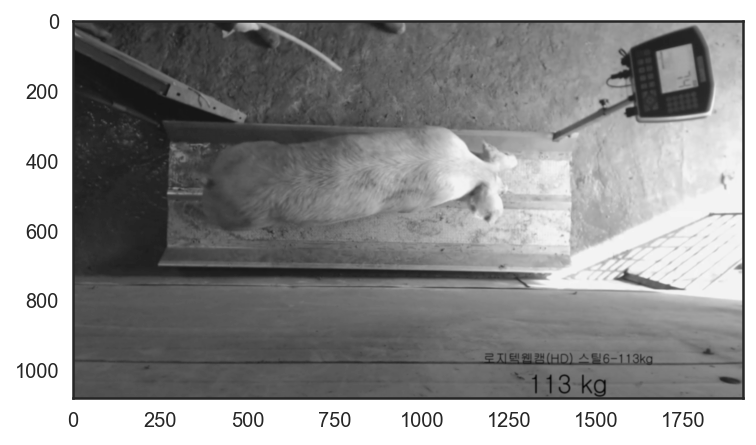

In [14]:
img = cv2.imread('../sample_image/logitech/sample113_1.png',0)
plt.imshow(img, cmap='gray', interpolation='bicubic')
plt.show()

In [18]:
img.shape

(1080, 1920)

# crop the images

In [15]:
img113_1 = cv2.imread('../sample_image/logitech/sample113_1.png',0)[200:700, 200:1500]
img114_1 = cv2.imread('../sample_image/logitech/sample114_1.png',0)[200:700, 200:1500]
img115_1 = cv2.imread('../sample_image/logitech/sample115_1.png',0)[200:700, 200:1500]
img115_2 = cv2.imread('../sample_image/logitech/sample115_2.png',0)[200:700, 200:1500]
img118_1 = cv2.imread('../sample_image/logitech/sample118_1.png',0)[200:700, 200:1500]
img120_1 = cv2.imread('../sample_image/logitech/sample120_1.png',0)[200:700, 200:1500]
img123_1 = cv2.imread('../sample_image/logitech/sample123_1.png',0)[200:700, 200:1500]

In [17]:
img113_1.shape

(500, 1300)

In [16]:
img113_1

array([[ 21,  21,  21, ..., 151, 151, 151],
       [ 21,  21,  21, ..., 151, 151, 151],
       [ 21,  21,  21, ..., 152, 152, 152],
       ...,
       [ 32,  32,  32, ..., 197, 194, 189],
       [ 32,  32,  32, ..., 196, 193, 191],
       [ 32,  32,  32, ..., 196, 197, 199]], dtype=uint8)

In [3]:
X0 = np.array([img113_1, img114_1, img115_1, img115_2, img118_1, img120_1, img123_1])

# scaling images

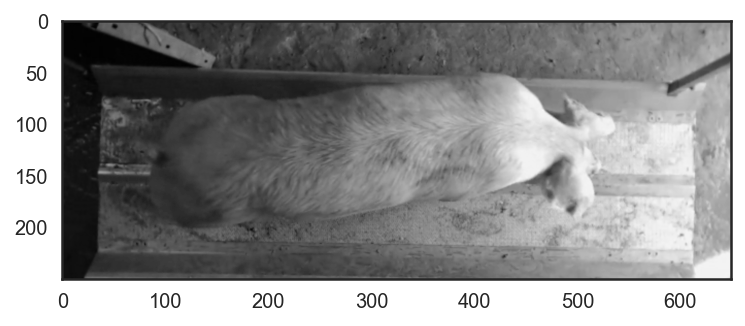

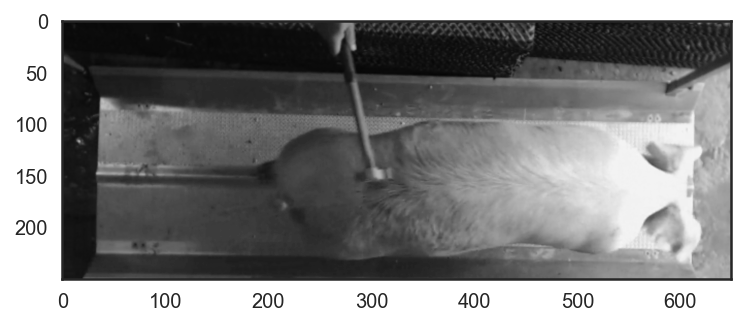

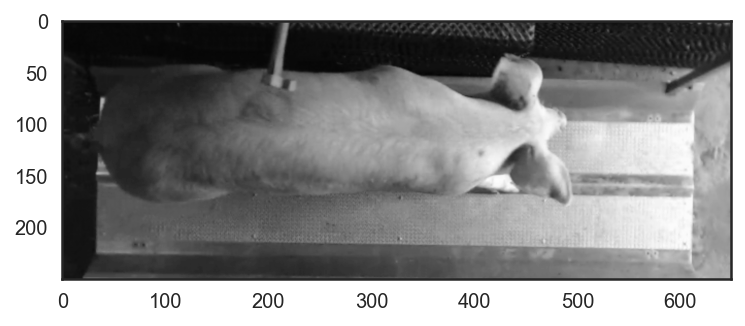

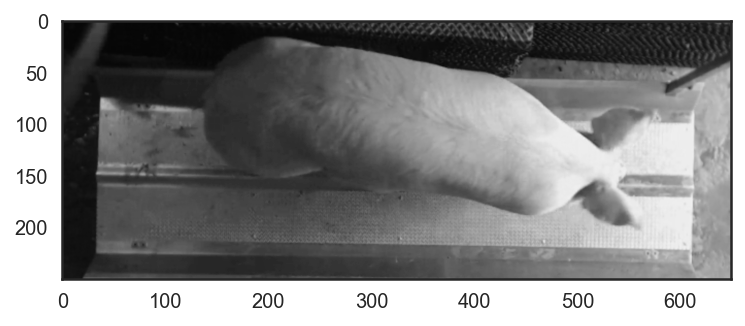

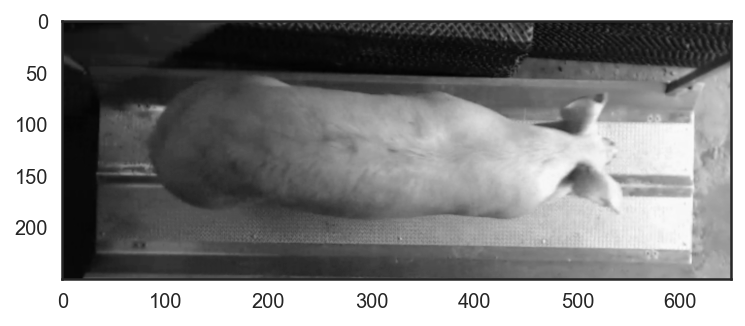

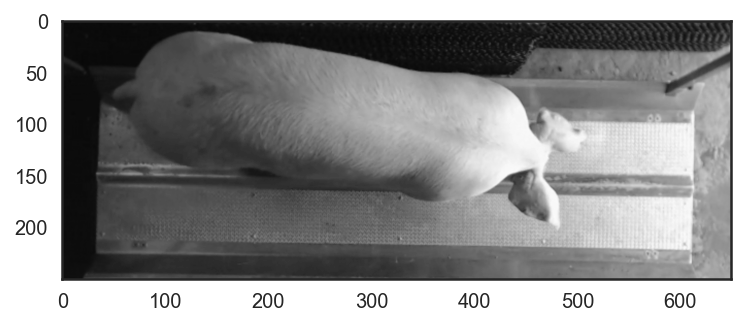

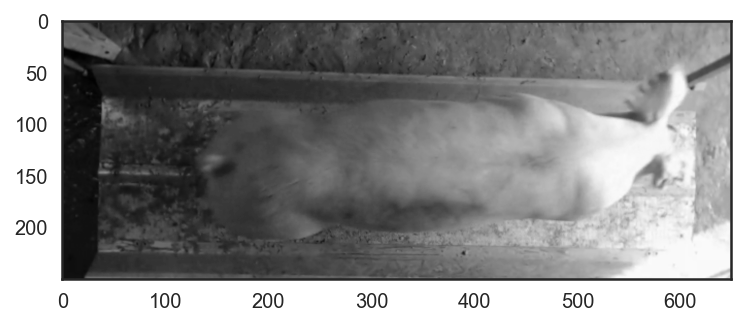

In [5]:
tmp = []
for img in X0:
#     print(img.shape)
    res = cv2.resize(img,(int(X0.shape[2]/2), int(X0.shape[1]/2)), interpolation = cv2.INTER_CUBIC)
    tmp.append(res)
    plt.imshow(res, cmap='gray', interpolation='bicubic')
    plt.show()
X = np.array(tmp)    

Preferable interpolation methods are cv2.INTER_AREA for shrinking and cv2.INTER_CUBIC (slow) & cv2.INTER_LINEAR for zooming. 

In [6]:
# Mean, standard deviation of input data 

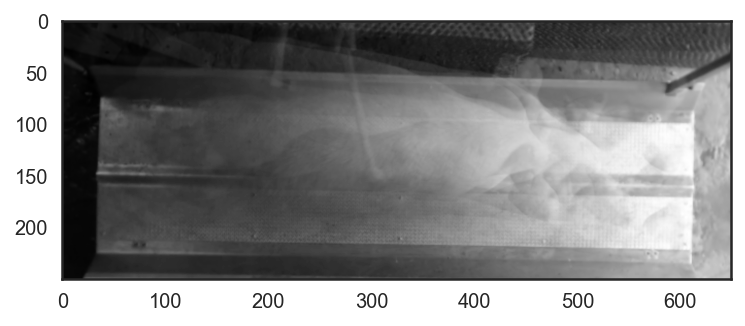

In [7]:
mean_img = np.average(X, axis=0)
plt.imshow(mean_img, cmap='gray', interpolation='bicubic')
plt.show()

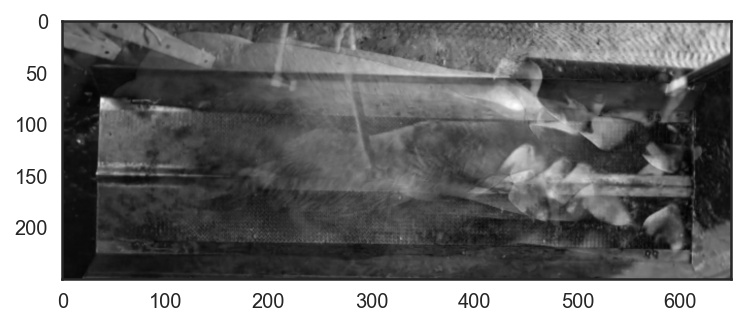

In [8]:
std_img = np.std(X, axis=0)
plt.imshow(std_img, cmap='gray', interpolation='bicubic')
plt.show()

# Normalizing image

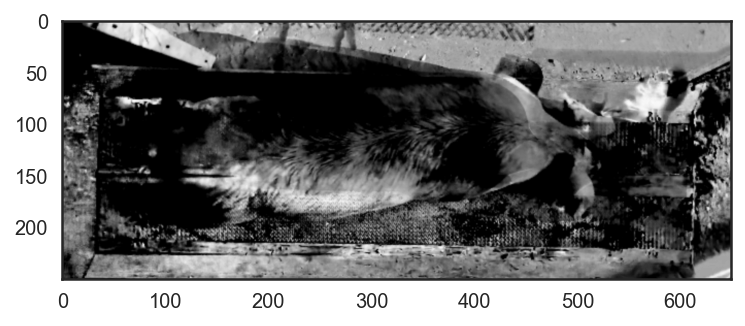

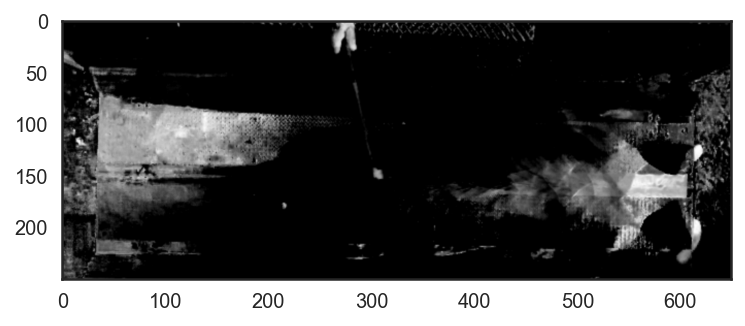

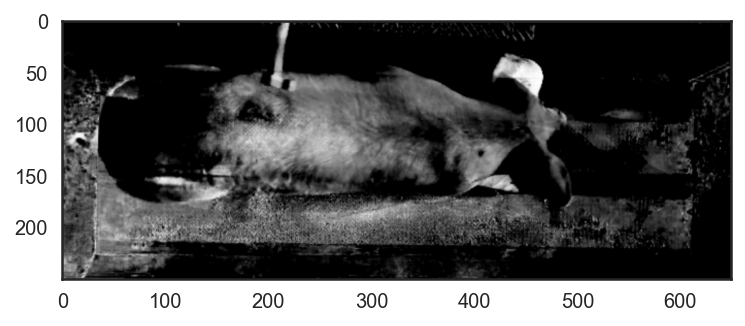

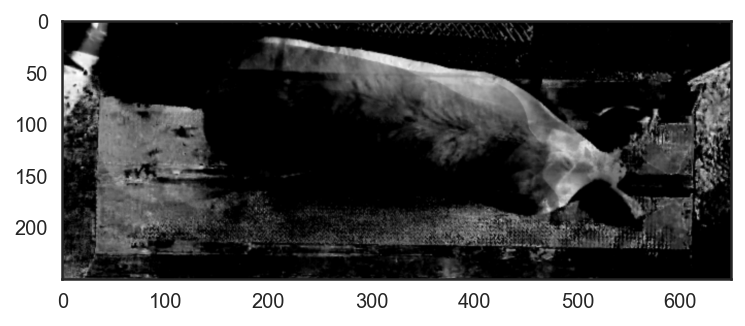

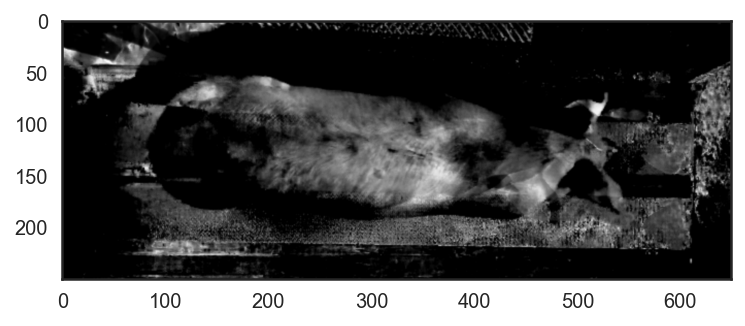

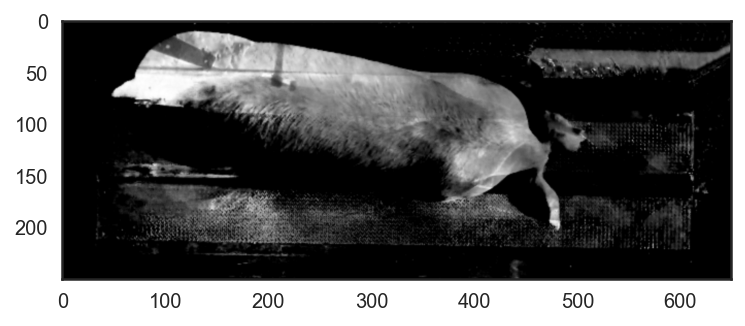

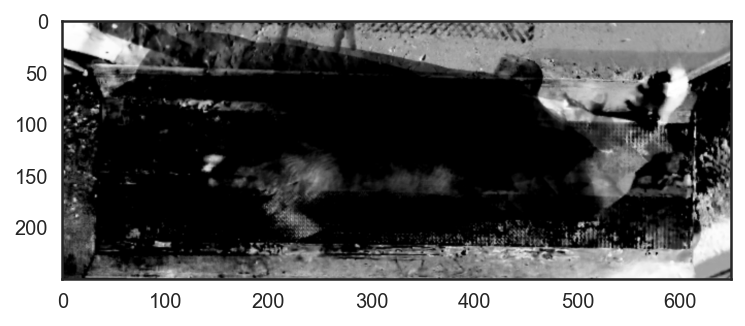

In [10]:
tmp = []
for img in X:
    res = (img - mean_img)/std_img
    res[res<0] = 0
    tmp.append(res)
    plt.imshow(res, cmap='gray', interpolation='bicubic')
    plt.show()    
X_norm1 = np.array(tmp)    

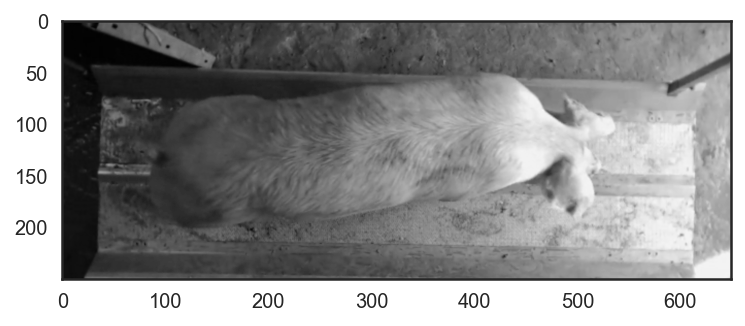

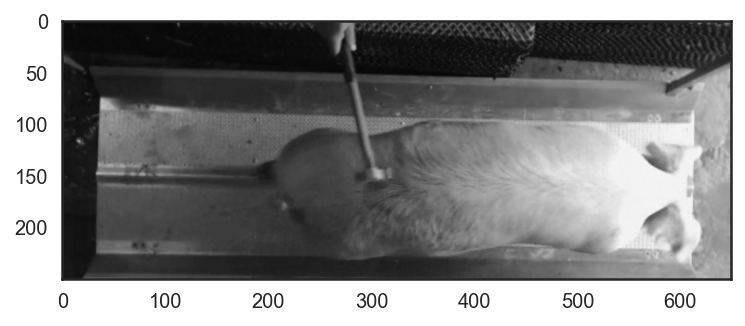

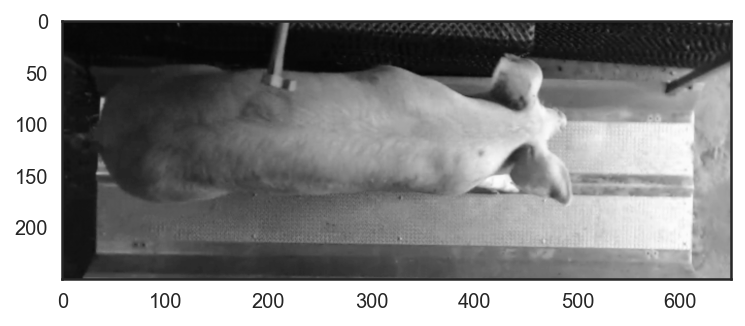

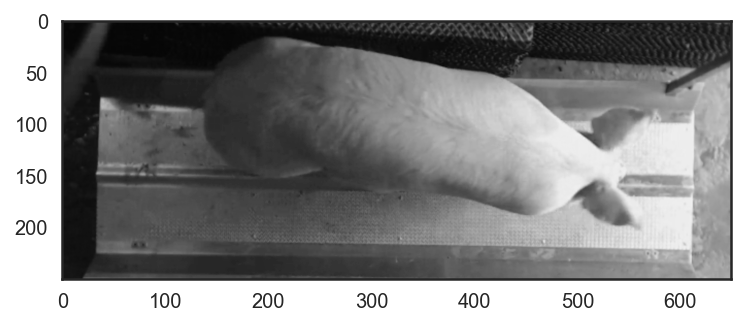

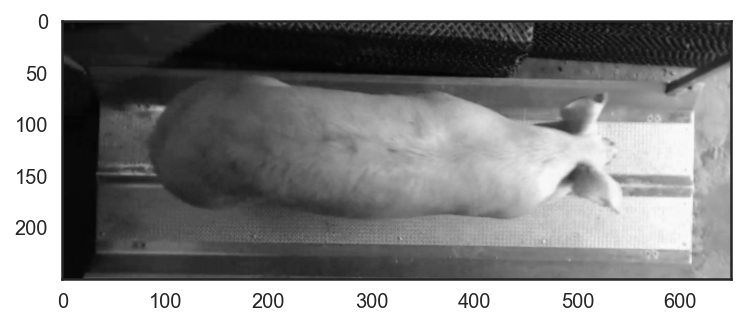

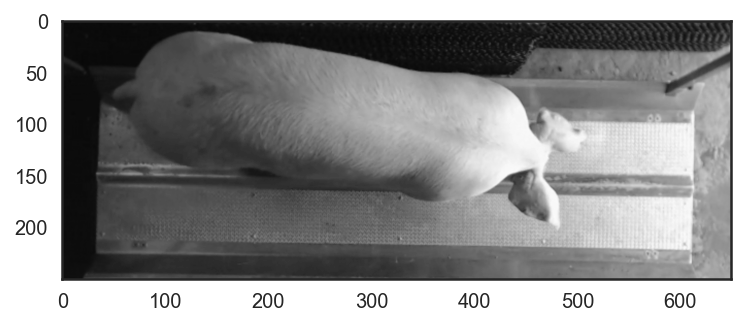

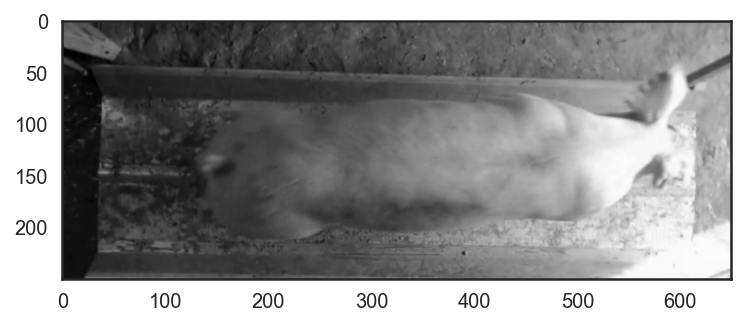

In [11]:
tmp = []
for img in X:
    res = img/255
    tmp.append(res)
    plt.imshow(res, cmap='gray', interpolation='bicubic')
    plt.show()    
X_norm2 = np.array(tmp)    

# Image Augmentation

In [20]:
from keras.preprocessing.image import ImageDataGenerator

In [59]:
train_generator = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=5,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=True,)

In [60]:
X_new = X[:,:,:,np.newaxis]
train_generator.fit(X_new)

In [62]:
# for i in range(len(X_new)):
#     plt.imshow(X_new[i, :, :, 0], cmap='gray', interpolation='bicubic')
#     plt.show()
#     plt.xticks([])
#     plt.yticks([])

In [63]:
batch_size = 7
iterator = train_generator.flow(X_new[:batch_size])

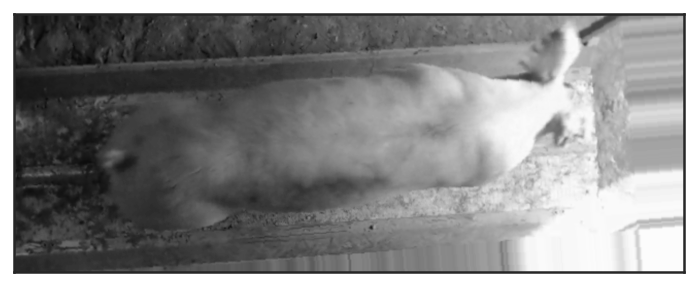

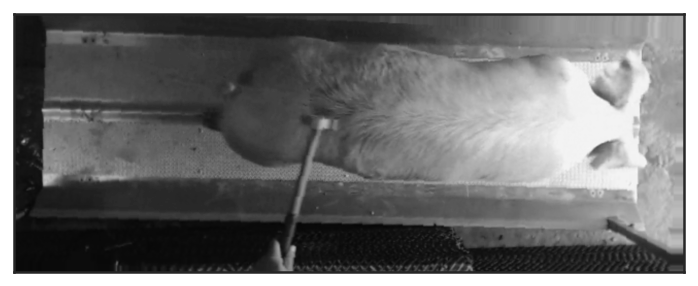

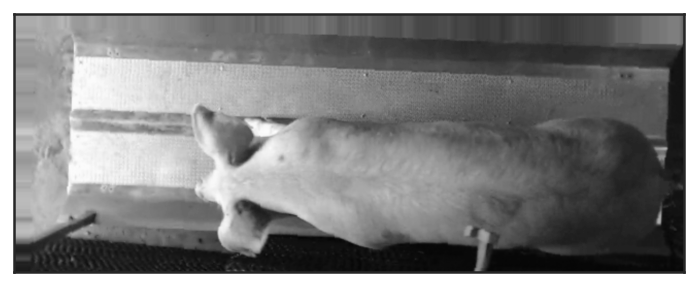

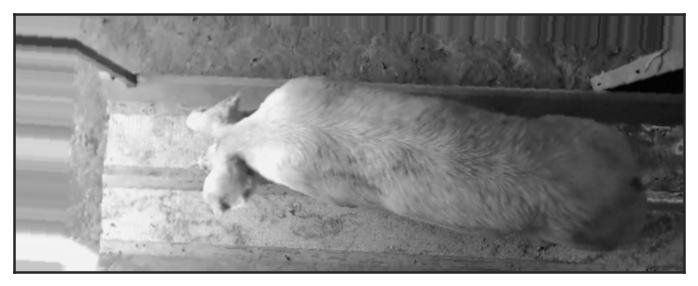

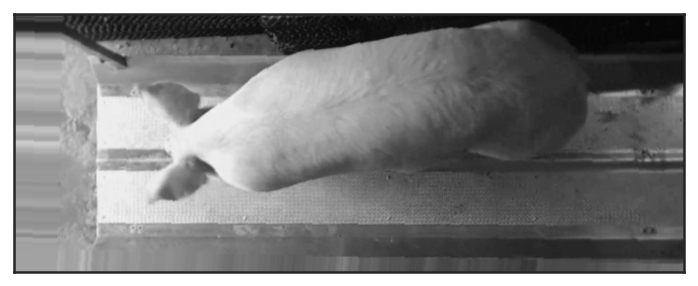

...

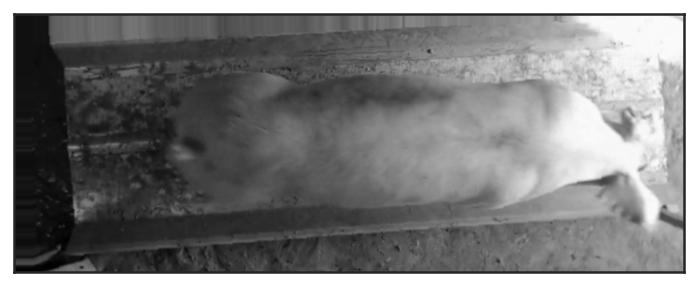

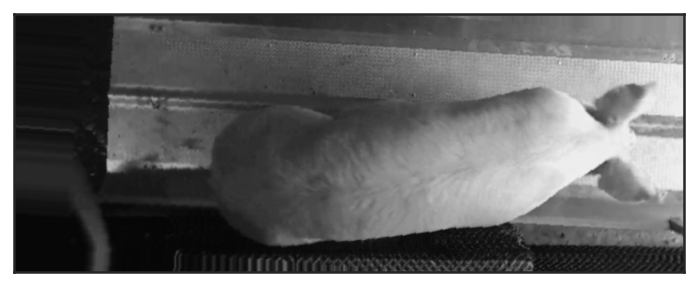

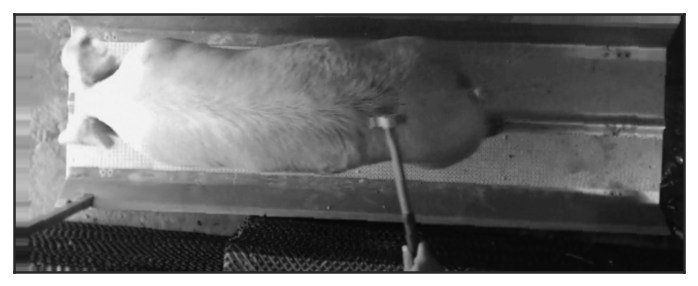

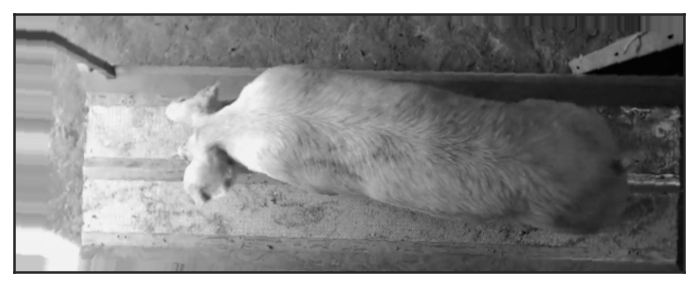

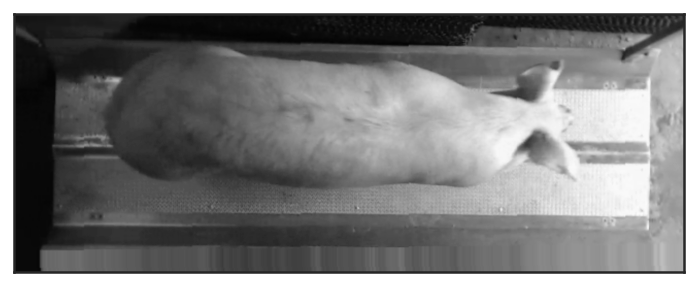

In [64]:
for i in range(int(35 / batch_size)):
    x_augs = iterator.next()
    for j in range(batch_size):
#         plt.subplot(5, 7, batch_size * i + j + 1)
        plt.imshow(x_augs[j, :, :, 0], cmap='gray', interpolation='bicubic')
        plt.xticks([])
        plt.yticks([])
        plt.show()
plt.tight_layout()

# Image flatten

In [78]:
print(np.shape(X[1].flatten() / 255.))
img113_1.flatten() / 255.

(162500,)


array([0.08235294, 0.08235294, 0.08235294, ..., 0.76862745, 0.77254902,
       0.78039216])

In [69]:
tmp = []
for img in X:
    res = img.flatten() / 255.
    tmp.append(res)
X_flatten = np.array(tmp)    

In [70]:
print(X_flatten.shape)
X_flatten

(7, 162500)


array([[0.08235294, 0.08235294, 0.08235294, ..., 0.79215686, 0.77254902,
        0.76470588],
       [0.07843137, 0.07843137, 0.08235294, ..., 0.6627451 , 0.65490196,
        0.64705882],
       [0.08627451, 0.08235294, 0.09019608, ..., 0.65882353, 0.65098039,
        0.64705882],
       ...,
       [0.09803922, 0.09803922, 0.09803922, ..., 0.67058824, 0.66666667,
        0.65882353],
       [0.08627451, 0.08627451, 0.08627451, ..., 0.63921569, 0.63529412,
        0.61568627],
       [0.34509804, 0.36470588, 0.38039216, ..., 0.81568627, 0.88627451,
        0.9254902 ]])